# Physics-Informed Neural Network (PINN) for Crop Yield Prediction

### by Farshad Goldoust

This notebook implements a PINN model that combines the SIMPLE crop model with deep learning for improved yield predictions.

## 1. Environment Setup

First, let's set up the environment for a crop modeling application by importing necessary libraries, loading crop and soil parameters from CSV files, and selecting specific crop data for further analysis. The imported libraries facilitate data handling, model training, and visualization, preparing the application for subsequent steps in the modeling process.

In [60]:
import sys
sys.path.append('./')

from SIMPLE.crop import *

# Load crop and soil parameters
crop_params = pd.read_csv('./SIMPLE/params/crop_params.csv', index_col='Crop')
soil_params = pd.read_csv('./SIMPLE/params/soil_params.csv', index_col='Crop')

# Select specific crop (e.g., Tomato with Cultivar 'SunnySD')
crop_params = crop_params.loc['Tomato'].iloc[0]  # Select first row for Tomato
soil_params = soil_params.loc['Tomato'].iloc[0]  # Select first row for Tomato

import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader # Dataset stores the samples and their corresponding labels,
# and DataLoader wraps an iterable around the Dataset to enable easy access to the samples.
import matplotlib.pyplot as plt

from load_synthetic_data import create_dataloaders, CropDataset
from sklearn.metrics import r2_score

## 2. Load and Prepare Data

Load our synthetic dataset that includes genetic traits and environmental conditions. Synthetic data is generated artifitially. Please see `generate_synthetic_data.py` for source.

In [61]:
# Create data loaders for training and testing
batch_size = 32
train_loader, test_loader = create_dataloaders(batch_size=batch_size)

# Test a batch to verify the data
for genetics, environment, yields in train_loader:
    print(f"Batch shapes:")
    print(f"  Genetics: {genetics.shape}")
    print(f"  Environment: {environment.shape}")
    print(f"  Yields: {yields.shape}")
    
    print(f"\nFeature ranges:")
    print(f"  Genetics: [{genetics.min():.3f}, {genetics.max():.3f}]")
    print(f"  Environment: [{environment.min():.3f}, {environment.max():.3f}]")
    print(f"  Yields: [{yields.min():.3f}, {yields.max():.3f}]")
    break

Batch shapes:
  Genetics: torch.Size([32, 5])
  Environment: torch.Size([32, 5])
  Yields: torch.Size([32, 1])

Feature ranges:
  Genetics: [0.192, 0.860]
  Environment: [0.006, 0.993]
  Yields: [0.243, 0.812]


## 3. Define the PINN Model


### Overview

The following section defines a class `PINN`, which is a neural network model that integrates genetic and environmental data to predict crop yields. It uses PyTorch as the deep learning framework. Overall, the `PINN` class combines neural network components with a physical crop model to predict crop yields based on genetic and environmental features. It encodes the input data, processes it through a neural network architecture, and integrates a physical model to ensure that the predictions are grounded in biological reality. The class is structured to facilitate both forward predictions and loss calculations based on the crop model's physics.

##### TL;DR

**Purpose**: The `PINN` class is designed to predict crop yields by combining two different approaches: traditional machine learning (via neural networks) and physics-based modeling (using a crop model). This hybrid approach aims to leverage the strengths of both methodologies to improve prediction accuracy.

### Key Components of the Class

#### Neural Network Components

- The class includes neural network layers (encoders and decoders) that are responsible for processing genetic and environmental features.

#### Encoding Input Data

- Genetic features (e.g., traits of the crop) and environmental features (e.g., temperature, rainfall) are separately encoded into latent representations. This step allows the model to learn complex relationships within the data.
- Each encoder transforms its respective input into a lower-dimensional space, capturing essential information while discarding noise.

#### Neural Network Architecture

- The architecture consists of multiple layers, including linear transformations and activation functions (like ReLU), which introduce non-linearity into the model.
- The output of the encoders is combined, allowing the model to learn from both genetic and environmental influences simultaneously.
- The decoder then processes this combined representation to produce the final output, which in this case is the predicted crop yield.

#### Integration of a Physical Crop Model

- The class incorporates a physics-based crop model (e.g., SIMPLE.crop), which simulates crop growth based on biological and environmental principles.
- This model uses parameters related to crop biology (like harvest index and temperature thresholds) to compute yields, ensuring that the predictions are not just statistical but also grounded in real-world agricultural science.

#### Grounding Predictions in Biological Reality

- By integrating the crop model, the `PINN` class ensures that the predictions are realistic and biologically plausible. This is crucial for applications in agriculture, where understanding the underlying processes can lead to better decision-making and management practices.
- The model is designed to account for the physical laws governing plant growth, making it more robust against overfitting to noise in the data.

### Functionality of the Class

#### Forward Predictions

- The `forward` method of the class facilitates the process of making predictions. When new data is provided (genetic and environmental features), the model processes this data through the encoders and decoder to output a predicted yield.
- This method encapsulates the entire flow of data through the network, from input to output, making it straightforward to use for inference.

#### Loss Calculations Based on Physics

- The `physics_loss` method calculates the loss based on the output of the crop model. This is particularly important for training the neural network.
- By using the crop model to inform the loss calculation, the model can learn not only from the data but also from the underlying biological principles, leading to potentially more accurate and generalizable predictions.

In [62]:
class PINN(nn.Module):
    def __init__(self, g_dim=5, e_dim=5, hidden_dim=64):
        super(PINN, self).__init__()
        
        # Genetic encoder
        self.g_encoder = nn.Sequential(
            nn.Linear(g_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, hidden_dim // 2)
        )
        
        # Environmental encoder
        self.e_encoder = nn.Sequential(
            nn.Linear(e_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, hidden_dim // 2)
        )
        
        # Decoder
        self.decoder = nn.Sequential(
            nn.Linear(hidden_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, 1)
        )
        
        # Initialize SIMPLE crop model
        from SIMPLE.crop import Crop  # Import the Crop class
        
        # Convert parameters to lists in the correct order
        crop_params_list = [
            float(crop_params['T_sum']),
            float(crop_params['HI']),
            float(crop_params['I_50A']),
            float(crop_params['I_50B']),
            float(crop_params['T_base']),
            float(crop_params['T_opt']),
            float(crop_params['RUE']),
            float(crop_params['I_50maxH']),
            float(crop_params['I_50maxW']),
            float(crop_params['T_heat']),
            float(crop_params['T_ext']),
            float(crop_params['S_CO2']),
            float(crop_params['S_water'])
        ]
        
        soil_params_list = [
            float(soil_params['AWC']),
            float(soil_params['RCN']),
            float(soil_params['DDC']),
            float(soil_params['RZD'])
        ]
        
        self.crop_model = Crop(crop_params_list, soil_params_list)
        
    def forward(self, g, e):
        g_encoded = self.g_encoder(g)
        e_encoded = self.e_encoder(e)
        combined = torch.cat((g_encoded, e_encoded), dim=1)
        return self.decoder(combined)
    
    def physics_loss(self, e_batch):
        # Convert tensors to numpy for SIMPLE model
        e_np = e_batch.detach().numpy()
        
        # Run SIMPLE model
        simple_yields = []
        for i in range(len(e_np)):
            # Reset crop model state for each sample
            self.crop_model.days = 0
            self.crop_model.TT = 0
            self.crop_model.biomass_cum = 0
            self.crop_model.yields = 0
            
            # Extract environmental variables
            t_max, t_min, rad, co2, rh = e_np[i]
            
            # Print values for debugging
            print(f"Sample {i}:")
            print(f"  t_max: {t_max}, t_min: {t_min}")
            print(f"  rad: {rad}, co2: {co2}")
            
            try:
                # Update crop model state
                self.crop_model.phenology(float(t_max), float(t_min))
                _, biomass = self.crop_model.growth(float(t_max), float(t_min), float(rad), float(co2))
                
                # Calculate yield
                current_yield = biomass * float(self.crop_model.HI)
                simple_yields.append(current_yield)
            except Exception as e:
                print(f"Error in sample {i}:")
                print(f"  {str(e)}")
                simple_yields.append(0.0)  # Fallback value
        
        # Convert to tensor
        simple_yields = torch.FloatTensor(simple_yields).reshape(-1, 1)
        return simple_yields

## 4. Training Functions

### Overview

This documentation describes the functionality of two functions: `train_epoch` and `evaluate`. These functions are designed to train and evaluate a machine learning model for predicting crop yields based on genetic and environmental features. The model incorporates both traditional loss metrics and physics-based predictions.

### Function: `train_epoch`

### Purpose
The `train_epoch` function trains the model for one epoch, processing batches of training data to update model parameters based on calculated losses.

### Parameters
- `model`: The neural network model to be trained.
- `train_loader`: A DataLoader object that provides batches of training data.
- `optimizer`: The optimizer used for updating the model parameters.
- `alpha` (default=0.5): A weighting factor for combining the mean squared error (MSE) loss and physics loss.

### Returns
- A tuple containing:
  - Average total loss for the epoch.
  - Average MSE loss for the epoch.
  - Average physics loss for the epoch.

### Functionality
1. **Set Model to Training Mode**: The model is set to training mode, enabling behaviors like dropout and batch normalization.
2. **Initialize Loss Accumulators**: Variables are initialized to accumulate total loss, MSE loss, physics loss, and the number of batches processed.
3. **Iterate Over Training Batches**: For each batch of genetic features, environmental features, and true yields:
   - **Forward Pass**: The model predicts yields based on the input features.
   - **Loss Calculation**:
     - Compute the MSE loss between predicted yields and true yields.
     - Calculate the physics loss using the model's physics loss method.
     - Combine the two losses using the provided weighting factor (`alpha`).
   - **Backward Pass**: Gradients are computed and model parameters are updated.
   - **Accumulate Losses**: The losses are added to the total accumulators for averaging after all batches are processed.
4. **Return Average Losses**: The function returns the average total loss, average MSE loss, and average physics loss for the epoch.

---

### Function: `evaluate`

### Purpose
The `evaluate` function assesses the performance of the trained model on a test dataset, calculating various metrics to quantify prediction accuracy.

### Parameters
- `model`: The trained neural network model to be evaluated.
- `test_loader`: A DataLoader object that provides batches of test data.
- `alpha` (default=0.5): A weighting factor for combining the mean squared error (MSE) loss and physics loss.

### Returns
- A tuple containing:
  - Average total loss for the evaluation.
  - Average MSE loss for the evaluation.
  - Root mean squared error (RMSE) for the evaluation.
  - R² score for the evaluation.

### Functionality
1. **Set Model to Evaluation Mode**: The model is set to evaluation mode, disabling dropout and batch normalization behaviors.
2. **Initialize Loss Accumulators**: Variables are initialized to accumulate total loss, MSE loss, physics loss, and the number of batches processed.
3. **Initialize Lists for Predictions and Actuals**: Empty lists are created to store predicted and actual yield values for later metric calculations.
4. **Iterate Over Test Batches**: For each batch of genetic features, environmental features, and true yields:
   - **Forward Pass**: The model predicts yields based on the input features.
   - **Loss Calculation**:
     - Compute the MSE loss between predicted yields and true yields.
     - Calculate the physics loss using the model's physics loss method.
     - Combine the two losses using the provided weighting factor (`alpha`).
   - **Accumulate Losses**: The losses are added to the total accumulators for averaging after all batches are processed.
   - **Store Predictions and Actuals**: Predictions and actual yield values are converted to NumPy arrays and stored for metric calculations.
5. **Calculate Metrics**: The function calculates:
   - Average MSE loss.
   - Root mean squared error (RMSE).
   - R² score using the stored predictions and actual values.
6. **Return Metrics**: The function returns the average total loss, average MSE, RMSE, and R² score for the evaluation.

--- 

This documentation provides a comprehensive overview of the `train_epoch` and `evaluate` functions, detailing their purpose, parameters, return values, and functionality.

In [63]:
def train_epoch(model, train_loader, optimizer, alpha=0.5):
    model.train()
    total_loss = 0
    total_mse = 0
    total_physics = 0
    n_batches = 0
    
    for g_batch, e_batch, y_batch in train_loader:
        # Forward pass
        y_pred = model(g_batch, e_batch)
        
        # Calculate losses
        mse_loss = nn.MSELoss()(y_pred, y_batch)
        physics_pred = model.physics_loss(e_batch)
        physics_loss = nn.MSELoss()(y_pred, physics_pred)
        
        # Combined loss
        loss = alpha * mse_loss + (1 - alpha) * physics_loss
        
        # Backward pass
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        # Accumulate losses
        total_loss += loss.item()
        total_mse += mse_loss.item()
        total_physics += physics_loss.item()
        n_batches += 1
    
    return total_loss/n_batches, total_mse/n_batches, total_physics/n_batches

def evaluate(model, test_loader, alpha=0.5):
    model.eval()
    total_loss = 0
    total_mse = 0
    total_physics = 0
    n_batches = 0
    
    predictions = []
    actuals = []
    
    with torch.no_grad():
        for g_batch, e_batch, y_batch in test_loader:
            # Forward pass
            y_pred = model(g_batch, e_batch)
            
            # Calculate losses
            mse_loss = nn.MSELoss()(y_pred, y_batch)
            physics_pred = model.physics_loss(e_batch)
            physics_loss = nn.MSELoss()(y_pred, physics_pred)
            
            # Combined loss
            loss = alpha * mse_loss + (1 - alpha) * physics_loss
            
            # Accumulate losses
            total_loss += loss.item()
            total_mse += mse_loss.item()
            total_physics += physics_loss.item()
            n_batches += 1
            
            # Store predictions and actuals
            predictions.extend(y_pred.numpy().flatten())
            actuals.extend(y_batch.numpy().flatten())
    
    # Calculate metrics
    mse = total_mse/n_batches
    rmse = np.sqrt(mse)
    r2 = r2_score(actuals, predictions)
    
    return total_loss/n_batches, mse, rmse, r2

## 5. Train the Model

This section of code initializes a `PINN` model and its optimizer, sets training parameters, and executes the training and evaluation processes over a specified number of epochs. It also plots the training loss components and test metrics after the training is completed.

Starting training...
Sample 0:
  t_max: 0.5249931216239929, t_min: 0.7156609892845154
  rad: 0.8486317992210388, co2: 0.839304506778717
Error in sample 0:
  cannot access local variable 'fCO2' where it is not associated with a value
Sample 1:
  t_max: 0.2746843099594116, t_min: 0.3028445243835449
  rad: 0.5098013877868652, co2: 0.8917233943939209
Error in sample 1:
  cannot access local variable 'fCO2' where it is not associated with a value
Sample 2:
  t_max: 0.5658727288246155, t_min: 0.33533862233161926
  rad: 0.7721404433250427, co2: 0.699347972869873
Error in sample 2:
  cannot access local variable 'fCO2' where it is not associated with a value
Sample 3:
  t_max: 0.35469532012939453, t_min: 0.04657064378261566
  rad: 0.16238826513290405, co2: 0.7885024547576904
Error in sample 3:
  cannot access local variable 'fCO2' where it is not associated with a value
Sample 4:
  t_max: 0.6888822913169861, t_min: 0.8914274573326111
  rad: 0.08940989524126053, co2: 0.5621558427810669
Error in

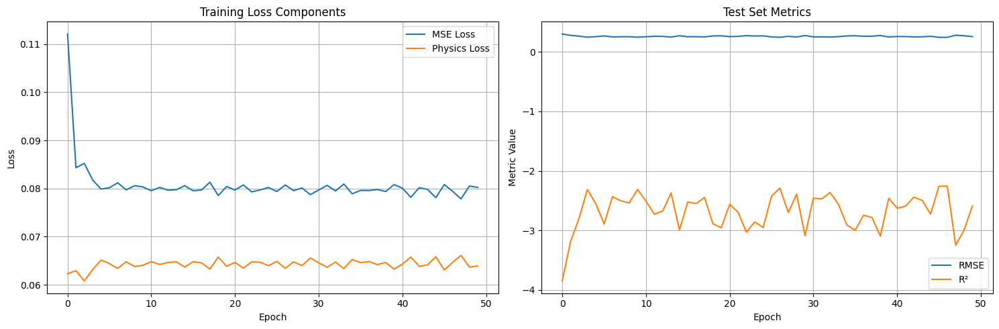

In [64]:
# Initialize model and optimizer
model = PINN()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

# Training parameters
n_epochs = 50
train_losses = []
test_losses = []
train_mse_losses = []
train_physics_losses = []
test_metrics = []

print("Starting training...")
for epoch in range(n_epochs):
    # Training
    train_loss, train_mse, train_physics = train_epoch(model, train_loader, optimizer)
    test_loss, test_mse, test_rmse, test_r2 = evaluate(model, test_loader)
    
    # Store losses
    train_losses.append(train_loss)
    test_losses.append(test_loss)
    train_mse_losses.append(train_mse)
    train_physics_losses.append(train_physics)
    test_metrics.append({
        'mse': test_mse,
        'rmse': test_rmse,
        'r2': test_r2
    })
    
    if (epoch + 1) % 5 == 0:
        print(f"\nEpoch [{epoch+1}/{n_epochs}]")
        print(f"Training - Total Loss: {train_loss:.4f}, MSE: {train_mse:.4f}, Physics: {train_physics:.4f}")
        print(f"Testing  - Total Loss: {test_loss:.4f}, RMSE: {test_rmse:.4f}, R²: {test_r2:.4f}")

print("\nTraining completed!")

# Plot training curves
plt.figure(figsize=(15, 5))

# Loss components
plt.subplot(1, 2, 1)
plt.plot(train_mse_losses, label='MSE Loss')
plt.plot(train_physics_losses, label='Physics Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss Components')
plt.legend()
plt.grid(True)

# Test metrics
plt.subplot(1, 2, 2)
epochs = range(n_epochs)
plt.plot([m['rmse'] for m in test_metrics], label='RMSE')
plt.plot([m['r2'] for m in test_metrics], label='R²')
plt.xlabel('Epoch')
plt.ylabel('Metric Value')
plt.title('Test Set Metrics')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

## 6. Visualize Results

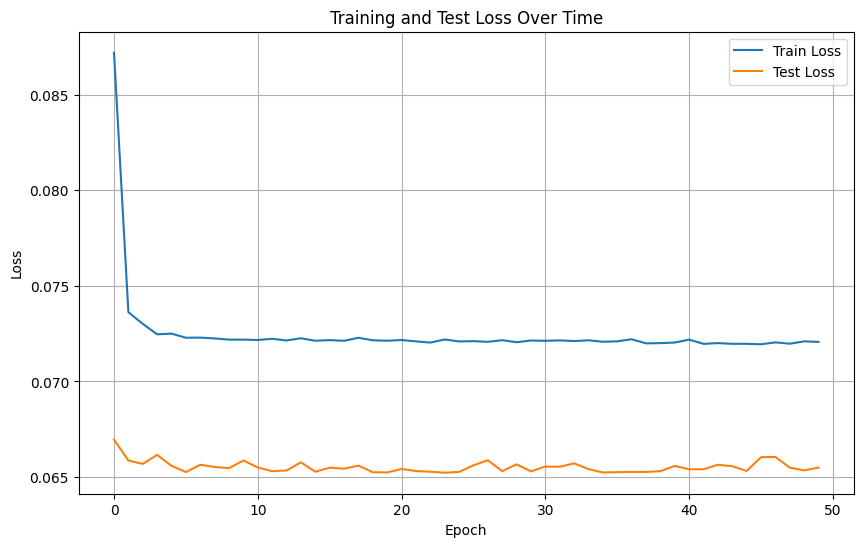

In [65]:
plt.figure(figsize=(10, 6))
plt.plot(train_losses, label='Train Loss')
plt.plot(test_losses, label='Test Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Test Loss Over Time')
plt.legend()
plt.grid(True)
plt.show()